In [1]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn import datasets
from sklearn.neural_network import MLPClassifier, MLPRegressor
from sklearn.metrics import accuracy_score, mean_squared_error
from IPython.display import Image
import math
#from IPython.core.interactiveshell import InteractiveShell
#InteractiveShell.ast_node_interactivity = "all"
import warnings
warnings.filterwarnings('ignore')

## Problem 1

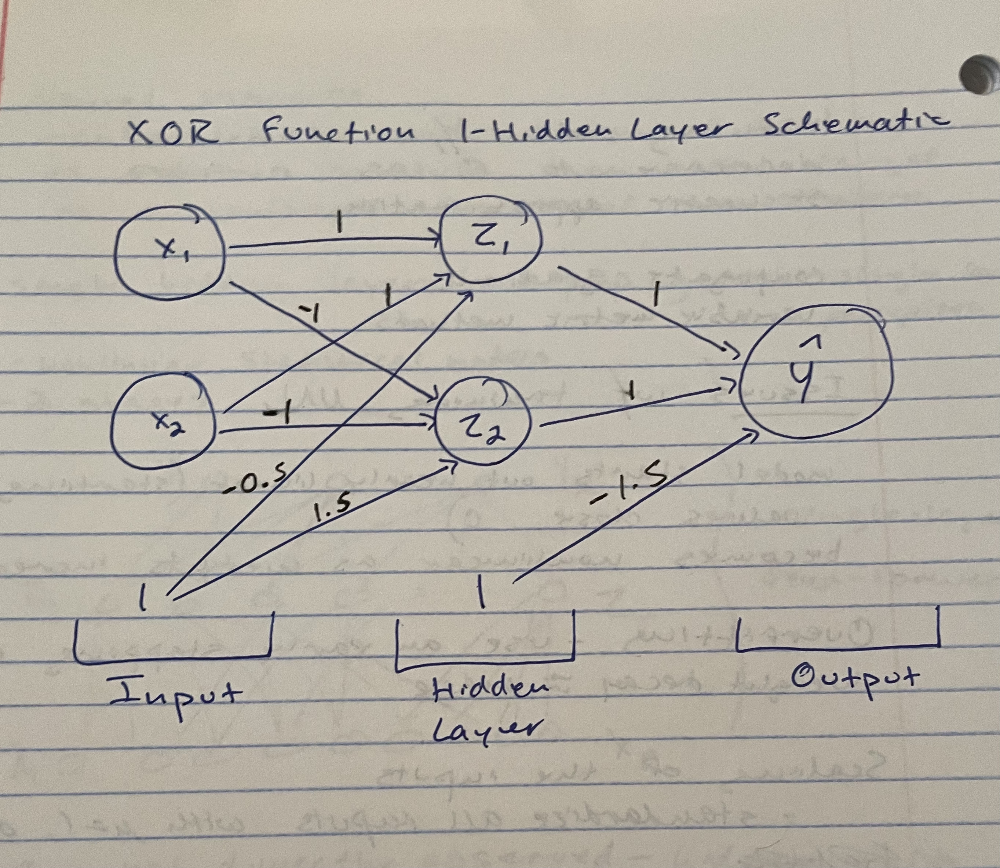

In [2]:
Image("Homework5Problem1.png")

## Problem 2 

In [3]:
import numpy as np
import sklearn.neural_network

inputs = np.array([[0,0],[0,1],[1,0],[1,1]])
expected_output = np.array([0,1,1,0])
np.random.seed(3)

model = sklearn.neural_network.MLPClassifier(activation='relu', 
                                             alpha = 0, 
                                             max_iter=10000, 
                                             hidden_layer_sizes=(4,),
                                             random_state = 1,
                                             tol=0,
                                             early_stopping=False,
                                             solver = 'sgd')
model.fit(inputs, expected_output)

print('predictions:', model.predict(inputs))
print('score:', model.score(inputs, expected_output))
print('weights:\n', model.coefs_)

predictions: [0 1 1 0]
score: 1.0
weights:
 [array([[-0.16595599,  2.31199094, -0.99977125, -2.30564449],
       [-0.70648822, -2.31205229, -0.62747958,  2.30554497]]), array([[-0.64751268],
       [ 3.24154314],
       [-1.0354419 ],
       [ 3.22145834]])]


## Problem 3 - skipped - no idea how to do this ##

It bears repeating that there is no way we could solve this problem without either previous knowledge (that wasn't specified in the prerequisites) or extensive research online, outside of the materials provided for the course.

## Problem 4

In [4]:
# Helper functions to create data
def sigmoid(x):
    sig = 1/(1+math.e**-x)
    return sig

def create_X(x1, x2):
    x_list = []
    for i in range(len(x1)):
        x_list.append(np.array([x1[i], x2[i]]))
    X = np.array(x_list)
    return X

def create_Y(X, a1, a2, z):
    Y_list =[]
    for i in range(len(X)):
        y = sigmoid(np.dot(a1,X[i])) + (np.dot(a2,X[i]))**2 + 0.3*z[i]
        Y_list.append(y)
    Y = np.array(Y_list)
    return Y

Part a

In [5]:
# Train and fit model with epochs = 10000 and lambda = 0

mlp = MLPRegressor(hidden_layer_sizes=(10,), activation='logistic', alpha=0,
                    solver='sgd', tol=1e-4, random_state=1, max_iter = 100,
                    learning_rate_init=.1)

In [6]:
# Generate training data
np.random.seed(0)
x1_train = np.random.normal(size = (100,))
x2_train = np.random.normal(size = (100,))
z_train = np.random.normal(size = (100,))
a1 = np.array([3,3])
a2 = np.array([3,-3])

X_train = create_X(x1_train, x2_train)
Y_train = create_Y(X_train, a1, a2, z_train)

# Fit model
mlp.fit(X_train, Y_train)

# Generate test data
np.random.seed(8)
x1_test = np.random.normal(size = (1000,))
x2_test = np.random.normal(size = (1000,))
z_test = np.random.normal(size = (1000,))
a1 = np.array([3,3])
a2 = np.array([3,-3])

X_test = create_X(x1_test, x2_test)
Y_test = create_Y(X_test, a1, a2, z_test)

In [7]:
# Compute training error
predictions_train = mlp.predict(X_train)
mean_squared_error(predictions_train, Y_train)

7.917456712339097

In [8]:
# Compute test error
predictions_test = mlp.predict(X_test)
mean_squared_error(predictions_test,Y_test)

45.55581763116222

Part b

As the number of epochs increases, the training and test MSEs both decrease, but the test MSE is always higher than the training MSE. This means that the number of epochs can decrease MSE but not ameliorate overfitting.

In [9]:
def vary_iterations(iter_array):
    
    training_error_list = []
    test_error_list = []
    
    for i in range(len(iter_array)):
        
        # Set up MLPRegressor for each value of max_iter
        mlp = MLPRegressor(hidden_layer_sizes=(10,), activation='logistic', alpha=0,
                        solver='adam', tol=1e-4, random_state=1, max_iter = iter_array[i],
                        learning_rate_init=.1)
        
        mlp.fit(X_train, Y_train)

        # Compute training error
        predictions = mlp.predict(X_train)
        training_error = mean_squared_error(predictions, Y_train)
        training_error_list.append(training_error)
    
        # Compute test error
        predictions_test = mlp.predict(X_test)
        test_error = mean_squared_error(predictions_test, Y_test)
        test_error_list.append(test_error)
        
    return training_error_list, test_error_list

iterations = np.arange(start = 50, stop = 10000, step = 50)
t1, t2 = vary_iterations(iterations)

for i in range(len(iterations)):
    print('max_iter: ', iterations[i])
    print('training_error: ', t1[i])
    print('test_error: ', t2[i])

max_iter:  50
training_error:  445.32684469174484
test_error:  600.4251132149247
max_iter:  100
training_error:  399.5045726747106
test_error:  558.8087030611025
max_iter:  150
training_error:  364.8893876715627
test_error:  527.6380961470327
max_iter:  200
training_error:  339.3402126164363
test_error:  505.85586180888527
max_iter:  250
training_error:  319.8619844594927
test_error:  490.7591341437794
max_iter:  300
training_error:  303.36838722759495
test_error:  478.61659504919754
max_iter:  350
training_error:  225.7264297749959
test_error:  406.22849824582715
max_iter:  400
training_error:  167.46282602264927
test_error:  350.33970398812266
max_iter:  450
training_error:  132.99495535698105
test_error:  313.80380302214473
max_iter:  500
training_error:  111.60682543048837
test_error:  290.1574092873095
max_iter:  550
training_error:  96.39052219131347
test_error:  269.8137166358056
max_iter:  600
training_error:  82.55671042663131
test_error:  252.31378143543984
max_iter:  650
tra

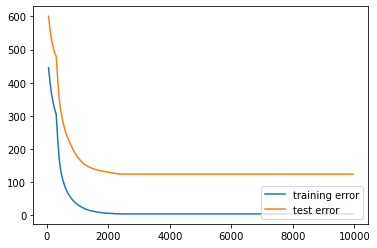

In [10]:
plt.plot(iterations,t1, label = "training error")
plt.plot(iterations, t2, label = "test error")
plt.legend(loc = "lower right")

Part c

The optimal lambda (regularization paramater) in terms of overfitting is about 0.3, which is where the test error is at its minimum.

In [11]:
def vary_lambda(iter_array):
    
    training_error_list = []
    test_error_list = []
    
    for i in range(len(iter_array)):
        
        # Set up MLPRegressor for each value of max_iter
        mlp = MLPRegressor(hidden_layer_sizes=(10,), activation='logistic', alpha=iter_array[i],
                        solver='sgd', tol=1e-4, random_state=1, max_iter = 1000,
                        learning_rate_init=.1
                          )
        
        mlp.fit(X_train, Y_train)

        # Compute training error
        predictions = mlp.predict(X_train)
        training_error = mean_squared_error(predictions, Y_train)
        training_error_list.append(training_error)
    
        # Compute test error
        predictions_test = mlp.predict(X_test)
        test_error = mean_squared_error(predictions_test, Y_test)
        test_error_list.append(test_error)
        
    return training_error_list, test_error_list

iterations = np.arange(start = .001, stop = 1, step = .001)
t1, t2 = vary_lambda(iterations)

for i in range(len(iterations)):
    print('lambda: ', iterations[i])
    print('training_error: ', t1[i])
    print('test_error: ', t2[i])

lambda:  0.001
training_error:  7.90176139914817
test_error:  45.56930407778107
lambda:  0.002
training_error:  7.8858013270596325
test_error:  45.58262831281156
lambda:  0.003
training_error:  4.974501642594211
test_error:  44.43033548542122
lambda:  0.004
training_error:  4.981958564460932
test_error:  44.4593957359728
lambda:  0.005
training_error:  4.989441161999628
test_error:  44.48848173710344
lambda:  0.006
training_error:  4.9969447706814565
test_error:  44.51759151215569
lambda:  0.007
training_error:  5.004464802931427
test_error:  44.54672312214119
lambda:  0.008
training_error:  5.011996740135321
test_error:  44.57587466137459
lambda:  0.009000000000000001
training_error:  5.019536125079471
test_error:  44.60504425332276
lambda:  0.010000000000000002
training_error:  5.027078554826615
test_error:  44.63423004667129
lambda:  0.011
training_error:  5.034619673833352
test_error:  44.663430211528116
lambda:  0.012
training_error:  5.042155167997078
test_error:  44.692642936057

lambda:  0.28700000000000003
training_error:  1.6810543242094707
test_error:  47.80819473945452
lambda:  0.28800000000000003
training_error:  1.681747260121934
test_error:  47.82378022789563
lambda:  0.28900000000000003
training_error:  1.682445767530458
test_error:  47.83936803381852
lambda:  0.29
training_error:  1.6831498508445242
test_error:  47.85495811935431
lambda:  0.291
training_error:  1.683859514513484
test_error:  47.87055044678179
lambda:  0.292
training_error:  1.6845747630257586
test_error:  47.886144978528954
lambda:  0.293
training_error:  1.7156070513178272
test_error:  47.9604729343848
lambda:  0.294
training_error:  1.7163085097641586
test_error:  47.97539339695046
lambda:  0.295
training_error:  1.7170151904359827
test_error:  47.99031519791858
lambda:  0.296
training_error:  1.7177270988091964
test_error:  48.00523830939282
lambda:  0.297
training_error:  1.7184442403782345
test_error:  48.02016270363342
lambda:  0.298
training_error:  1.719166620655382
test_error

lambda:  0.537
training_error:  2.1112962645394684
test_error:  51.48087443325183
lambda:  0.538
training_error:  2.1131513771793746
test_error:  51.49354575028064
lambda:  0.539
training_error:  2.1150118130977997
test_error:  51.506216632883635
lambda:  0.54
training_error:  2.1451021313596472
test_error:  51.54474057246749
lambda:  0.541
training_error:  2.1469134071801816
test_error:  51.55675087685652
lambda:  0.542
training_error:  2.14872973716269
test_error:  51.568761099357545
lambda:  0.543
training_error:  2.150551122526211
test_error:  51.58077124028309
lambda:  0.544
training_error:  2.152377564480875
test_error:  51.59278129995964
lambda:  0.545
training_error:  2.15420906422786
test_error:  51.60479127872776
lambda:  0.546
training_error:  2.15604562295948
test_error:  51.61680117694185
lambda:  0.547
training_error:  2.1578872418591626
test_error:  51.628810994970316
lambda:  0.548
training_error:  2.159733922101498
test_error:  51.6408207331955
lambda:  0.549
training_

training_error:  3.154017603905745
test_error:  55.43605762646271
lambda:  0.871
training_error:  3.157092020856331
test_error:  55.44624705708865
lambda:  0.872
training_error:  3.1601703697273233
test_error:  55.45643812610029
lambda:  0.873
training_error:  3.163252649759982
test_error:  55.46663083518694
lambda:  0.874
training_error:  3.1663388601929596
test_error:  55.47682518603586
lambda:  0.875
training_error:  3.169429000262329
test_error:  55.487021180332185
lambda:  0.876
training_error:  3.172523069201656
test_error:  55.49721881975901
lambda:  0.877
training_error:  3.175621066241908
test_error:  55.50741810599727
lambda:  0.878
training_error:  3.1787229906114844
test_error:  55.5176190407258
lambda:  0.879
training_error:  3.1818288415362748
test_error:  55.52782162562125
lambda:  0.88
training_error:  3.1849386182396193
test_error:  55.53802586235808
lambda:  0.881
training_error:  3.188052319942305
test_error:  55.54823175260857
lambda:  0.882
training_error:  3.19116

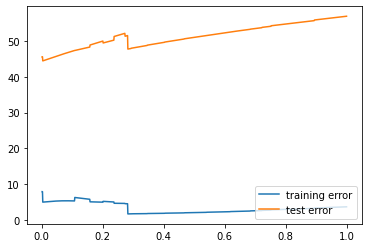

In [12]:
plt.plot(iterations,t1, label = "training error")
plt.plot(iterations, t2, label = "test error")
plt.legend(loc = "lower right")

Part d

The minimum number of hidden units to perform well in selecting epochs and lambda is 10, if considering only 1 through 10. Otherwise, it appears that more hidden units leads to better model performance until a certain point, given a constant number of epocsh and lambda. In this model, that number is 38 hidden units, which minimizes the test error. With more than 38 hidden units, the test error increases, first slowly and then sharply.

In [13]:
def vary_hidden_units(iter_array):
    
    training_error_list = []
    test_error_list = []
    
    for i in iter_array:
        
        # Set up MLPRegressor for each value of max_iter
        mlp = MLPRegressor(hidden_layer_sizes=(i,), activation='logistic', alpha=.01,
                        solver='sgd', tol=1e-4, random_state=1, max_iter = 10000,
                        learning_rate_init=.1
                          )
        
        mlp.fit(X_train, Y_train)

        # Compute training error
        predictions = mlp.predict(X_train)
        training_error = mean_squared_error(predictions, Y_train)
        training_error_list.append(training_error)
    
        # Compute test error
        predictions_test = mlp.predict(X_test)
        test_error = mean_squared_error(predictions_test, Y_test)
        test_error_list.append(test_error)
        
    return training_error_list, test_error_list

iterations = np.arange(start = 1, stop = 50)
t1, t2 = vary_hidden_units(iterations)

for i in range(len(iterations)):
    print('hidden_units: ', iterations[i])
    print('training_error: ', t1[i])
    print('test_error: ', t2[i])

hidden_units:  1
training_error:  273.1107861080595
test_error:  399.44943105035156
hidden_units:  2
training_error:  266.3862297821224
test_error:  404.95903252888775
hidden_units:  3
training_error:  271.9175180962553
test_error:  416.92039476999895
hidden_units:  4
training_error:  89.8244644139697
test_error:  203.11401815671303
hidden_units:  5
training_error:  77.29962502060768
test_error:  169.92837565663064
hidden_units:  6
training_error:  42.83681969990571
test_error:  139.9588312132451
hidden_units:  7
training_error:  49.55074177445144
test_error:  123.98611163127215
hidden_units:  8
training_error:  7.355638878724376
test_error:  63.24718203807902
hidden_units:  9
training_error:  0.1241900419712793
test_error:  49.78627470844152
hidden_units:  10
training_error:  5.027078554826833
test_error:  44.634230046671405
hidden_units:  11
training_error:  0.11022912916569258
test_error:  43.60057561671292
hidden_units:  12
training_error:  0.44913807768404085
test_error:  45.24030

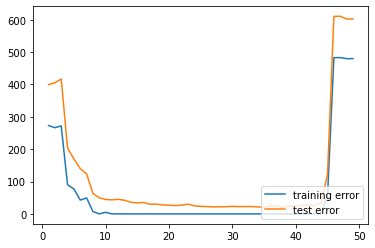

In [14]:
plt.plot(iterations,t1, label = "training error")
plt.plot(iterations, t2, label = "test error")
plt.legend(loc = "lower right")